In [3]:
import numpy as np 
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelBinarizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/tabular-playground-series-aug-2022/sample_submission.csv
/kaggle/input/tabular-playground-series-aug-2022/train.csv
/kaggle/input/tabular-playground-series-aug-2022/test.csv


In [4]:
df = pd.read_csv('../input/tabular-playground-series-aug-2022/train.csv')

In [3]:
df.describe()

,id,loading,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
count,26570.000000,26320.000000,26570.000000,26570.000000,26570.000000,26570.000000,26570.000000,26189.000000,26032.000000,25894.000000,...,25343.000000,25270.000000,25102.000000,24969.000000,24796.000000,24696.000000,24561.000000,24460.000000,24286.000000,26570.000000
mean,13284.500000,127.826233,6.754046,7.240459,7.415883,8.232518,6.256568,17.791528,11.731988,17.127804,...,11.430725,16.117711,19.172085,11.702464,15.652904,16.048444,14.995554,16.460727,701.269059,0.212608
std,7670.242662,39.030020,1.471852,1.456493,4.116690,4.199401,3.309109,1.001200,0.996085,0.996414,...,0.999137,1.405978,1.520785,1.488838,1.155247,1.491923,1.549226,1.708935,123.304161,0.409160
min,0.000000,33.160000,5.000000,5.000000,0.000000,0.000000,0.000000,13.968000,8.008000,12.073000,...,7.537000,9.323000,12.461000,5.167000,10.890000,9.140000,9.104000,9.701000,196.787000,0.000000
25%,6642.250000,99.987500,6.000000,6.000000,4.000000,5.000000,4.000000,17.117000,11.051000,16.443000,...,10.757000,15.209000,18.170000,10.703000,14.890000,15.057000,13.957000,15.268000,618.961500,0.000000
50%,13284.500000,122.390000,6.000000,8.000000,7.000000,8.000000,6.000000,17.787000,11.733000,17.132000,...,11.430000,16.127000,19.211500,11.717000,15.628500,16.040000,14.969000,16.436000,701.024500,0.000000
75%,19926.750000,149.152500,8.000000,8.000000,10.000000,11.000000,8.000000,18.469000,12.410000,17.805000,...,12.102000,17.025000,20.207000,12.709000,16.374000,17.082000,16.018000,17.628000,784.090250,0.000000
max,26569.000000,385.860000,9.000000,9.000000,29.000000,29.000000,24.000000,21.499000,16.484000,21.425000,...,15.412000,22.479000,25.640000,17.663000,22.713000,22.303000,21.626000,24.094000,1312.794000,1.000000


In [22]:
df.isna().sum()

id                   0
product_code         0
loading            250
attribute_0          0
attribute_1          0
attribute_2          0
attribute_3          0
measurement_0        0
measurement_1        0
measurement_2        0
measurement_3      381
measurement_4      538
measurement_5      676
measurement_6      796
measurement_7      937
measurement_8     1048
measurement_9     1227
measurement_10    1300
measurement_11    1468
measurement_12    1601
measurement_13    1774
measurement_14    1874
measurement_15    2009
measurement_16    2110
measurement_17    2284
failure              0
dtype: int64

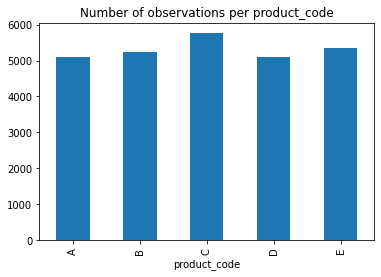

In [33]:
df.groupby('product_code')['measurement_0'].count().plot(kind='bar')
plt.title('Number of observations per product_code')
plt.show()

We have some categorical variables (attributes 2 and 3 and measurements 0 to 2).

In [4]:
df.dtypes

id                  int64
product_code       object
loading           float64
attribute_0        object
attribute_1        object
attribute_2         int64
attribute_3         int64
measurement_0       int64
measurement_1       int64
measurement_2       int64
measurement_3     float64
measurement_4     float64
measurement_5     float64
measurement_6     float64
measurement_7     float64
measurement_8     float64
measurement_9     float64
measurement_10    float64
measurement_11    float64
measurement_12    float64
measurement_13    float64
measurement_14    float64
measurement_15    float64
measurement_16    float64
measurement_17    float64
failure             int64
dtype: object

Pairplots seem to indicate that some measurements have a very low correlation. We can confirm that with a correlation matrix but for now measurements 3 to 16 would probably add little information if added into a model.

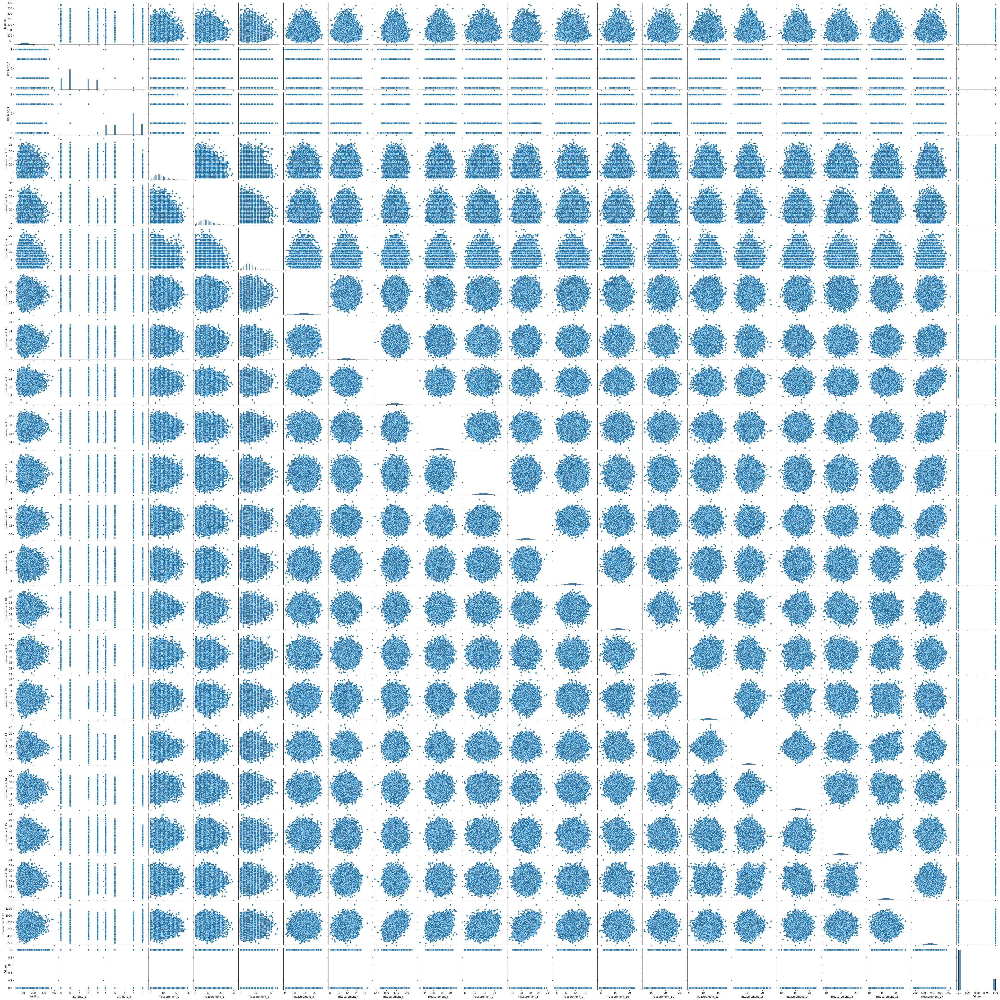

In [5]:
sns.pairplot(df.drop('id', axis=1))

Only a few features seem highly correlated

<AxesSubplot:>

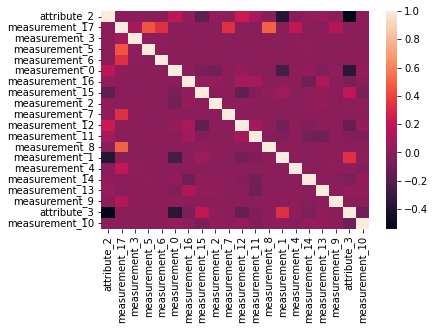

In [7]:
cols = list(set(df.columns) - set(['id', 'product_code', 'loading', 'failure']))
sns.heatmap(df[cols].corr())

<AxesSubplot:>

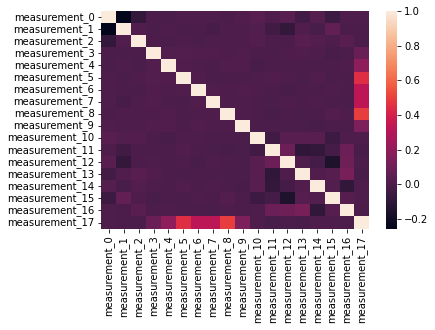

In [8]:
cols = [x for x in df.columns if 'measurement_' in x]
sns.heatmap(df[cols].corr())

In [9]:
df['measurement_0'].unique()

array([ 7, 14, 12, 13,  9, 11,  4, 10,  6,  8, 21, 15, 17, 18, 19, 16,  5,
       25,  3,  1, 23, 20, 22,  2, 26, 24,  0, 29, 27])

In [10]:
df['measurement_1'].unique()

array([ 8,  3,  1,  2,  4,  6,  0,  9,  5,  7, 10, 12, 11, 13, 17, 14, 16,
       15, 18, 20, 24, 22, 21, 19, 23, 27, 25, 26, 29, 28])

In [11]:
df['measurement_2'].unique()

array([ 4,  3,  5,  6,  8,  0,  7,  2, 10,  9, 15, 12, 11,  1, 13, 16, 14,
       19, 17, 18, 20, 21, 23, 24, 22])

In [12]:
df['attribute_0'].unique()

array(['material_7', 'material_5'], dtype=object)

In [13]:
df['attribute_1'].unique()

array(['material_8', 'material_5', 'material_6'], dtype=object)

From the catplots, materials 5 and 6 tend to have a lower failure rate.

# **Categorical Data Analysis**

Using category plots we can analyze the interaction of each categorical variable with the target.

The list of categorical variables is:
* measurement_0
* measurement_1
* measurement_2
* attribute_0
* attribute_1

**Measurement 0**
Seems like out of 30 categories, the first 16/17 have very little impact on failure state. We could probably group this under one category to reduce the number of variables created if we use One-Hot-Encoding for example. In particular, categories 27 to 29 seem to be very indicative of absence of failure except this is because they only occur once or twice in the dataset.

**Measurement 1**
Same as measurement 0, first 16 to 17 have very little impact. In particular, categories 28 and 29 seem to be very indicative of absence of failure except this is because they only occur once or twice in the dataset.

**Measurement 2**
This one is slightly different and only the first 12 categories seem quite insignificant with respect to failure state. Again we can group those categories under one when using one-hot encoding. In particular, categories 22 and 23 seem to be very indicative of absence of failure except this is because they only occur once or twice in the dataset.

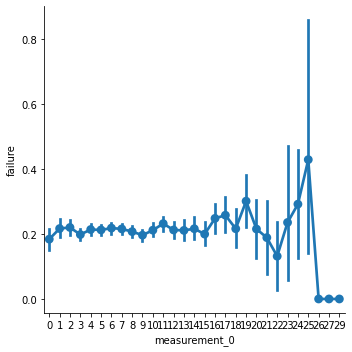

In [14]:
sns.catplot(x="measurement_0", y="failure", kind="point", data=df)

In [15]:
df.groupby('measurement_0')['measurement_0'].count()

measurement_0
0      538
1      799
2     1255
3     1827
4     2280
5     2585
6     2816
7     2719
8     2457
9     2069
10    1725
11    1411
12    1074
13     787
14     648
15     456
16     359
17     229
18     199
19     113
20      79
21      53
22      38
23      17
24      24
25       7
26       4
27       1
29       1
Name: measurement_0, dtype: int64

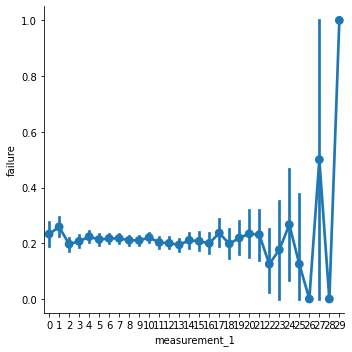

In [16]:
sns.catplot(x="measurement_1", y="failure", kind="point", data=df)

In [17]:
df.groupby('measurement_1')['measurement_1'].count()

measurement_1
0      378
1      653
2     1016
3     1358
4     1724
5     2103
6     2375
7     2552
8     2597
9     2357
10    2089
11    1855
12    1515
13    1117
14     816
15     637
16     471
17     317
18     212
19     169
20      94
21      78
22      40
23      17
24      15
25       8
26       3
27       2
28       1
29       1
Name: measurement_1, dtype: int64

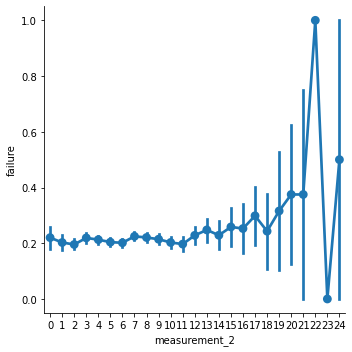

In [18]:
sns.catplot(x="measurement_2", y="failure", kind="point", data=df)

In [19]:
df.groupby('measurement_2')['measurement_2'].count()

measurement_2
0      418
1     1071
2     1749
3     2350
4     3012
5     3241
6     3155
7     2892
8     2543
9     1875
10    1465
11     985
12     714
13     452
14     258
15     147
16      91
17      67
18      37
19      19
20      16
21       8
22       1
23       2
24       2
Name: measurement_2, dtype: int64

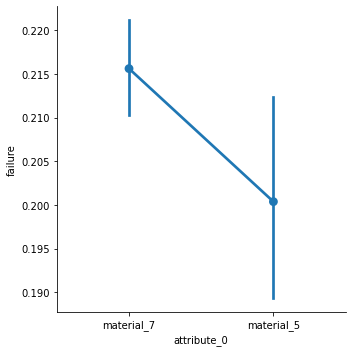

In [20]:
sns.catplot(x="attribute_0", y="failure", kind="point", data=df)

In [21]:
df.groupby('attribute_0')['attribute_0'].count()

attribute_0
material_5     5250
material_7    21320
Name: attribute_0, dtype: int64

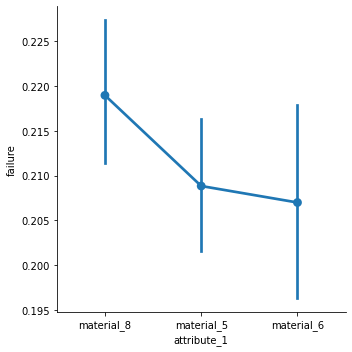

In [22]:
sns.catplot(x="attribute_1", y="failure", kind="point", data=df)

In [23]:
df.groupby('attribute_1')['attribute_1'].count()

attribute_1
material_5    10362
material_6     5343
material_8    10865
Name: attribute_1, dtype: int64

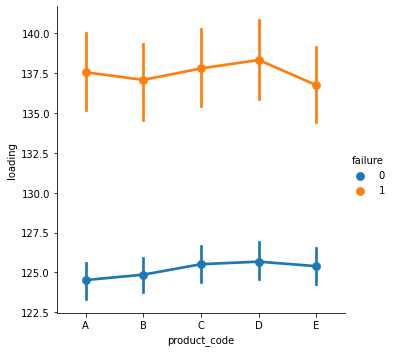

In [24]:
sns.catplot(x="product_code", y="loading", hue='failure', kind="point", data=df)

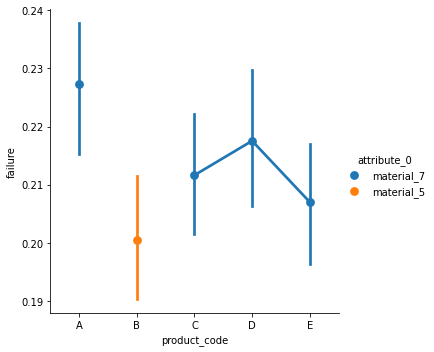

In [25]:
sns.catplot(x="product_code", y="failure", hue='attribute_0', kind="point", data=df)

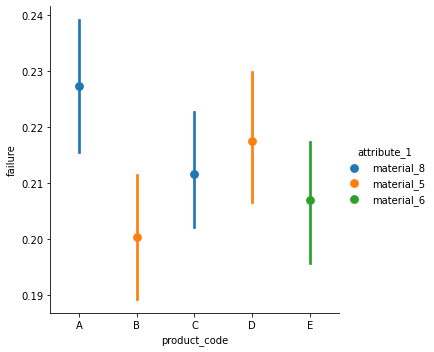

In [26]:
sns.catplot(x="product_code", y="failure", hue='attribute_1', kind="point", data=df)

# Modeling

Initial steps envisioned are the following:
* Group irrelevant categories of measurement 0, 1, 2.
* One hot encoding of measurement 0, 1, 2 as well as attribute 0 and 1.
* Build a train set of the most explanatory variables:
 * Binary variables created from:
   * categories 27 to 29 of measurement 0
   * categories 16 and 17 of measurement 1
   * categories 22 and 23 of measurement 2
   * attribute 0 and 1
 * Measurement 5, 6, 7, 8 and 17
 
* Experiment with a few classification models 

In [24]:
X = df[["product_code","attribute_0","attribute_1","measurement_5","measurement_6","measurement_7","measurement_8","measurement_17"]]
y = df["failure"]

numeric_features = ["measurement_5","measurement_6","measurement_7","measurement_8","measurement_17"]
numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="median")), ("scaler", StandardScaler())]
)

# binary_categorical_features = ["attribute_0"]
# binary_categorical_transformer = LabelBinarizer()

categorical_features = ["product_code","attribute_0","attribute_1"]
categorical_transformer = OneHotEncoder(handle_unknown="ignore")

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
#         ("bin_cat", binary_categorical_transformer, binary_categorical_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("classifier", GradientBoostingClassifier())]
)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

clf.fit(X_train, y_train)
print("model score: %.3f" % clf.score(X_test, y_test))

model score: 0.793


In [25]:
df_test = pd.read_csv('../input/tabular-playground-series-aug-2022/test.csv')

In [38]:
X_predict = df_test[["product_code","attribute_0","attribute_1","measurement_5","measurement_6","measurement_7","measurement_8","measurement_17"]]
res = clf.predict_proba(X_predict)

In [50]:
res = pd.concat([df_test['id'], pd.Series(res[:,1])], axis=1).rename(columns={0:'failure'})
res = res.set_index('id')
res.to_csv('submission.csv')

TypeError: '(slice(None, None, None), 1)' is an invalid key